# Project Report (Canadian Community Well-Being Index)

## Introduction:



## Preliminary Exploratory Data Analysis
Note that we have imported and built up the data frame and some function in the Jupyter notebook, here are our steps.

### Importing Packages

Before we look at the dataset, we need to first import the packages and libraries we need.

In [9]:
library(tidyverse)
library(repr)
library(tidymodels)
library(ISLR)
library(cowplot)
library(GGally)
library(kknn)

### Reading Dataset

We have stored the dataset into a csv file, and import the file into Jupyter Notebook for analysis. We directly used the function read_csv to view the csv file downloaded.

Some of the observations are not including certain information, therefore, we use function "filter" to remove these observations beforing actually analyzing, and obtain a clean data frame.

In [19]:
raw_data <- read_csv("CWB_2021.csv")

database <- raw_data |>
            filter(Census_Population_2021 != "NA") |>
            filter(Income_2021 != "NA") |>
            filter(Education_2021 != "NA") |>
            filter(Housing_2021 != "NA") |>
            filter(Labour_Force_Activity_2021 != "NA") |>
            filter(CWB_2021 != "NA")


#database$CWB_2021 <- cut(database$CWB_2021,
#                         breaks = c(0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100),
#                         labels = c("0-10", "10-20", "20-30", "30-40", "40-50", "50-60", "60-70",
#                                    "70-80", "80-90", "90-100"),
#                         include.lowest = TRUE)

head(database)



Rows: 5161 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (2): CSD_Name_2021, Community_Type_2021
dbl (7): CSD_Code_2021, Census_Population_2021, Income_2021, Education_2021,...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


CSD_Code_2021,CSD_Name_2021,Census_Population_2021,Income_2021,Education_2021,Housing_2021,Labour_Force_Activity_2021,CWB_2021,Community_Type_2021
<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1001113,Trepassey,405,76,48,97,70,73,Non-Indigenous Community
1001124,"Division No. 1, Subd. U",1373,81,63,98,77,80,Non-Indigenous Community
1001126,Cape Broyle,499,78,57,97,74,77,Non-Indigenous Community
1001131,Renews-Cappahayden,280,79,59,94,72,76,Non-Indigenous Community
1001149,Ferryland,371,83,56,96,68,76,Non-Indigenous Community
1001155,"Division No. 1, Subd. W",469,78,58,99,69,76,Non-Indigenous Community


### General View of the Data

Now the first several rows of the data has been shown, and it seems well-organized and tidy. Since the goal is to predict the CWB index by 4 predictors (income, education, housing, labour force), we need to have a glance at each of the variables for a deeper insight.

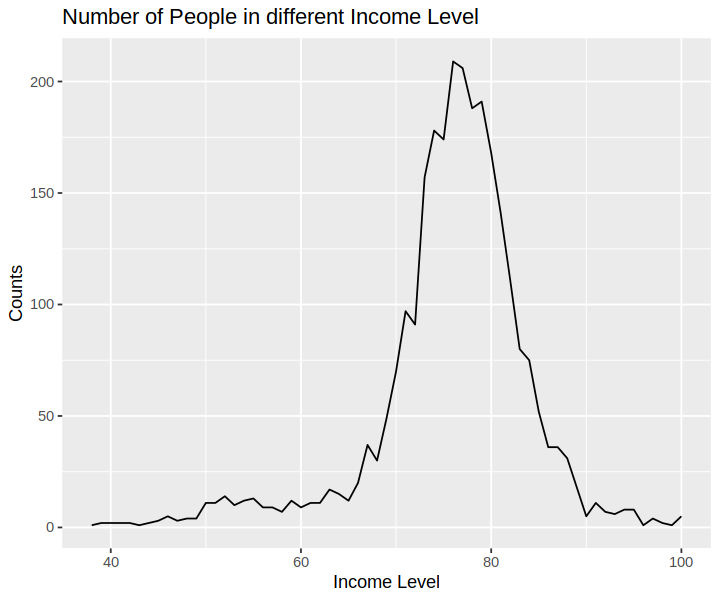

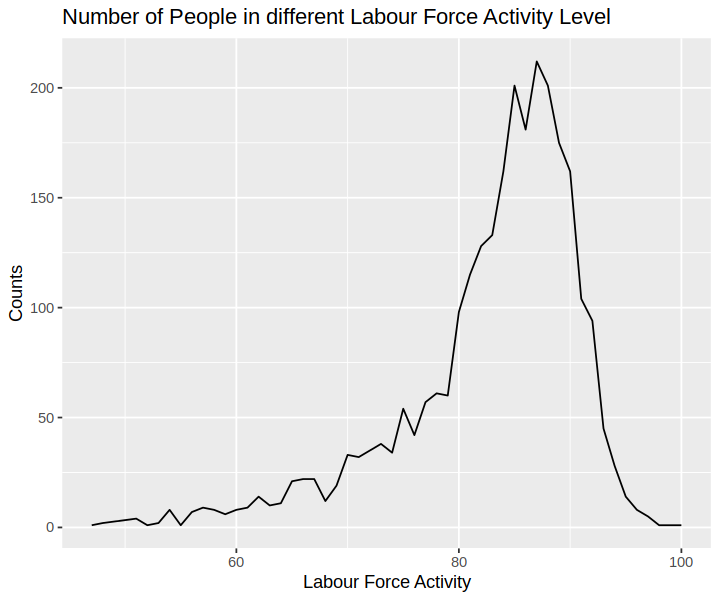

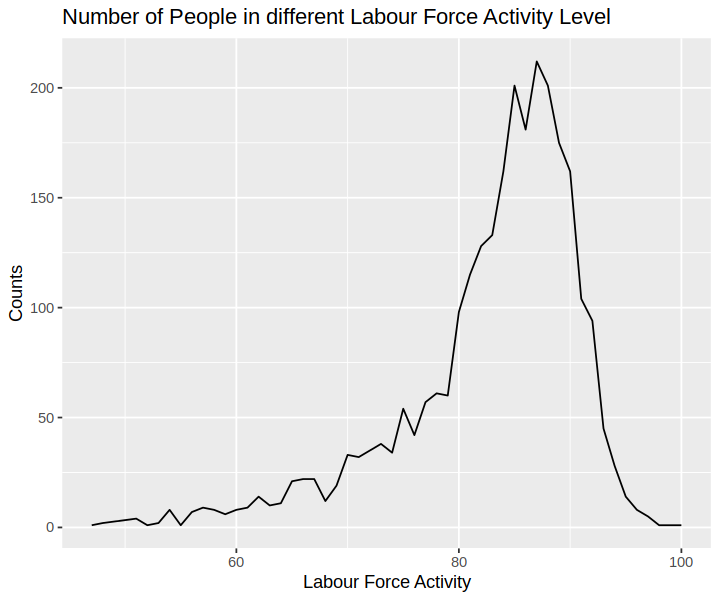

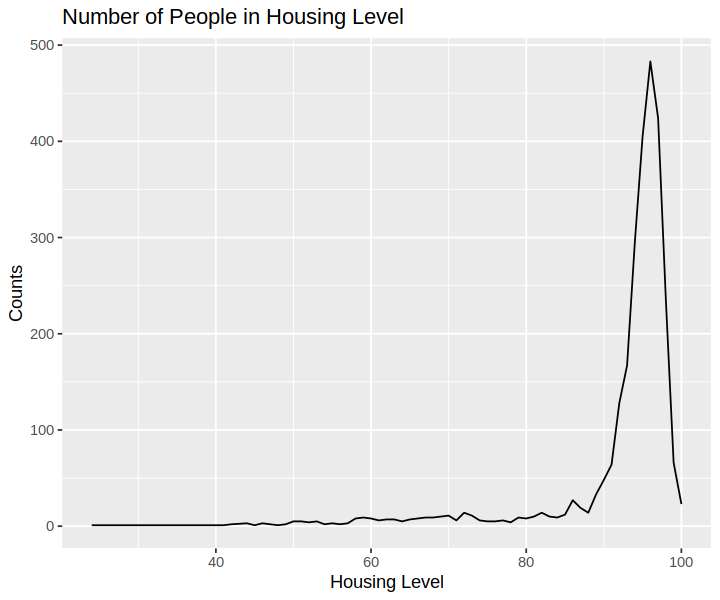

In [20]:
set.seed(1234)
options(repr.plot.width=6, repr.plot.height=5)
# splitting data into training data and testing data
database_split <- initial_split(database, prop = 0.75,strata = CSD_Code_2021)
database_train <- training(database_split)
database_test <- testing(database_split)

# count the number of patients with different ages
count_income <- database_train |>
             group_by(Income_2021) |>
             summarize(count = n())

hist_income <- ggplot(count_income, aes(x = Income_2021, y = count)) +
            geom_line() +
            xlab("Income Level") +
            ylab("Counts") +
            ggtitle("Number of People in different Income Level")


count_edu <- database_train |>
             group_by(Education_2021) |>
             summarize(count = n())

hist_edu <- ggplot(count_edu, aes(x = Education_2021, y = count)) +
            geom_line() +
            xlab("Education Level") +
            ylab("Counts") +
            ggtitle("Number of People in different Education Level")


count_labour <- database_train |>
             group_by(Labour_Force_Activity_2021) |>
             summarize(count = n())

hist_edu <- ggplot(count_labour, aes(x = Labour_Force_Activity_2021, y = count)) +
            geom_line() +
            xlab("Labour Force Activity") +
            ylab("Counts") +
            ggtitle("Number of People in different Labour Force Activity Level")


count_house <- database_train |>
             group_by(Housing_2021) |>
             summarize(count = n())

hist_house <- ggplot(count_house, aes(x = Housing_2021, y = count)) +
              geom_line() +
              xlab("Housing Level") +
              ylab("Counts") +
              ggtitle("Number of People in Housing Level")


hist_income
hist_edu
hist_edu
hist_house

In [21]:
#count the average value of variables
group_mean <- database_train |>
      summarize(across(Income_2021:Labour_Force_Activity_2021, mean)) 

print("Table 3: Mean values across Income, Education, Housing and Labour Force")
head(group_mean)

[1] "Table 3: Mean values across Income, Education, Housing and Labour Force"


Income_2021,Education_2021,Housing_2021,Labour_Force_Activity_2021
<dbl>,<dbl>,<dbl>,<dbl>
75.90188,56.52342,92.3246,82.93287


In [13]:
## Description of the variables

## Model


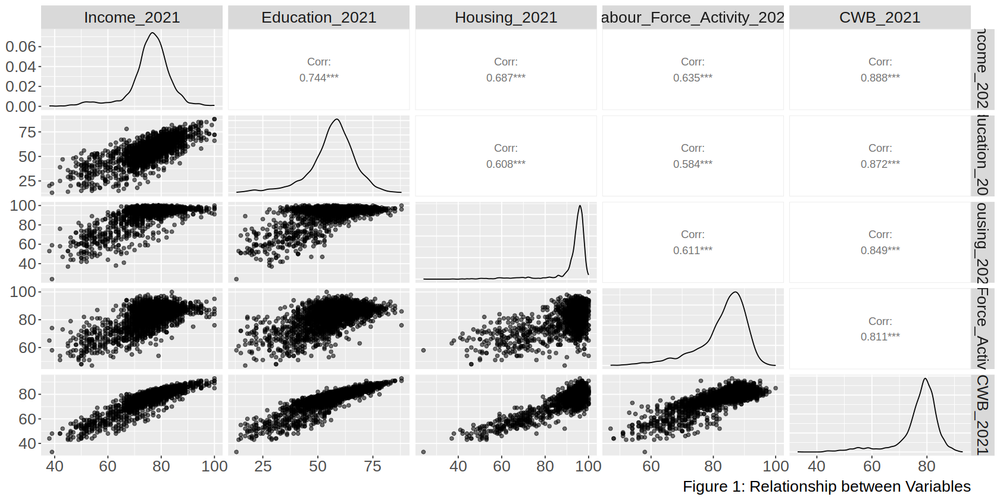

In [22]:
# Select and mutate to obtain a clean data frame, and only see variables we are insterested
database_train_selected <- database_train |>
                           select(Income_2021:CWB_2021) 

# Use ggpair to draw plots of relationship between variables
options(repr.plot.width = 14, repr.plot.height = 7)
graph <- database_train_selected |>
         ggpairs(mapping = aes(alpha = 0.4)) +
        labs(caption = "Figure 1: Relationship between Variables") +
         theme(text = element_text(size = 20))
graph

In [25]:
lm_spec <- linear_reg() |>
  set_engine("lm") |>
  set_mode("regression")

lm_recipe <- recipe(CWB_2021 ~ Income_2021 +  Education_2021 + Housing_2021 + Labour_Force_Activity_2021, 
                    data = database_train)

lm_fit <- workflow() |>
  add_recipe(lm_recipe) |>
  add_model(lm_spec) |>
  fit(data = database_train)

lm_fit


lm_test_results <- lm_fit |>
  predict(database_test) |>
  bind_cols(database_test) |>
  metrics(truth = CWB_2021, estimate = .pred)

lm_test_results

══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: linear_reg()

── Preprocessor ────────────────────────────────────────────────────────────────
0 Recipe Steps

── Model ───────────────────────────────────────────────────────────────────────

Call:
stats::lm(formula = ..y ~ ., data = data)

Coefficients:
               (Intercept)                 Income_2021  
                   0.06391                     0.25011  
            Education_2021                Housing_2021  
                   0.24988                     0.24929  
Labour_Force_Activity_2021  
                   0.25001  


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,0.3289944
rsq,standard,0.9980684
mae,standard,0.2683993
